# 📘 EDA Final Exam – Customer Churn Dataset

###### Objective: Identify patterns and features related to customer churn and provide 3 actionable recommendations to reduce churn.

### Imports

In [1]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', palette='muted', font_scale=1.1)

### Load Data

In [2]:
df = pd.read_csv(r"C:\Users\Alexander Olomokoro\Documents\Personal Projects\DS-ML Course\datasets\Churn_Modelling_With_Missing.csv")
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42.0,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41.0,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42.0,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39.0,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43.0,2,125510.82,1,1,1,79084.10,0


### Basic Info

In [3]:
print('Shape', df.shape)
df.info()
df.describe().T

Shape (10000, 14)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           9946 non-null   object 
 6   Age              9700 non-null   float64
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 1.1+ MB


,count,mean,std,min,25%,50%,75%,max
RowNumber,10000.0,5.000500e+03,2886.895680,1.00,2500.75,5.000500e+03,7.500250e+03,10000.00
CustomerId,10000.0,1.569094e+07,71936.186123,15565701.00,15628528.25,1.569074e+07,1.575323e+07,15815690.00
CreditScore,10000.0,6.505288e+02,96.653299,350.00,584.00,6.520000e+02,7.180000e+02,850.00
Age,9700.0,3.890876e+01,10.462194,18.00,32.00,3.700000e+01,4.400000e+01,92.00
Tenure,10000.0,5.012800e+00,2.892174,0.00,3.00,5.000000e+00,7.000000e+00,10.00
Balance,10000.0,7.648589e+04,62397.405202,0.00,0.00,9.719854e+04,1.276442e+05,250898.09
NumOfProducts,10000.0,1.530200e+00,0.581654,1.00,1.00,1.000000e+00,2.000000e+00,4.00
HasCrCard,10000.0,7.055000e-01,0.455840,0.00,0.00,1.000000e+00,1.000000e+00,1.00
IsActiveMember,10000.0,5.151000e-01,0.499797,0.00,0.00,1.000000e+00,1.000000e+00,1.00
EstimatedSalary,10000.0,1.000902e+05,57510.492818,11.58,51002.11,1.001939e+05,1.493882e+05,199992.48


### Automated EDA Report (Optional but recommended)

In [4]:
from ydata_profiling import ProfileReport
# profile = ProfileReport(df, title='Churn EDA Report', explorative=True)
# profile.to_file('churn_eda_report.html')

# To see inside Jupyter:
# profile.to_notebook_iframe()

### Missing Values and Duplicates

In [5]:
df.isnull().sum().sort_values(ascending=False)

Age                300
Gender              54
RowNumber            0
CustomerId           0
Surname              0
CreditScore          0
Geography            0
Tenure               0
Balance              0
NumOfProducts        0
HasCrCard            0
IsActiveMember       0
EstimatedSalary      0
Exited               0
dtype: int64

In [6]:
df.duplicated().sum()

0

In [7]:
# Handle missing age values
mean_age = df['Age'].mean()
mean_age

# round to nearestwhole number
mean_age_rounded = round(mean_age)

# Fill missing values in Age with rounded mean
df.Age.fillna(mean_age_rounded, inplace=True)

df.isnull().sum().sort_values(ascending=False)

Gender             54
RowNumber           0
CustomerId          0
Surname             0
CreditScore         0
Geography           0
Age                 0
Tenure              0
Balance             0
NumOfProducts       0
HasCrCard           0
IsActiveMember      0
EstimatedSalary     0
Exited              0
dtype: int64

In [8]:
# Handle missing gender values
mode_gender = df['Gender'].mode()[0]

# Fill missing values with most frequent gender
df['Gender'].fillna(mode_gender, inplace=True)

df.isnull().sum().sort_values(ascending=False)

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

### Drop Useless Columns

In [9]:
df_clean = df.copy()
df_clean = df_clean.drop(columns=['RowNumber', 'CustomerId', 'Surname'])

In [10]:
# profile = ProfileReport(df, title='Churn EDA Report', explorative=True)
# profile.to_file('churn_eda_report.html')

### Numeric Distribution

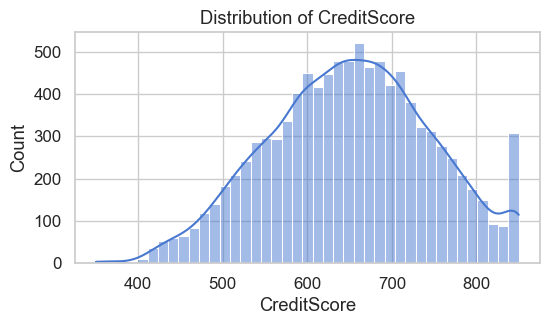

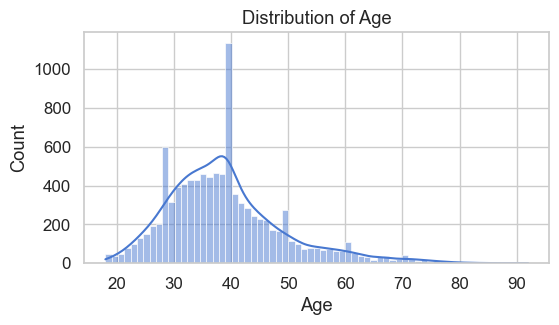

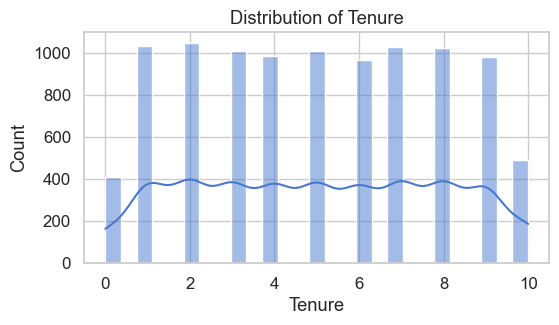

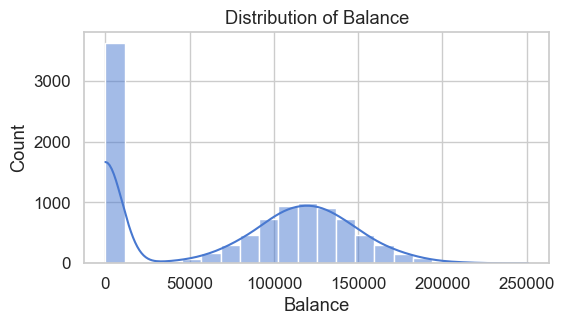

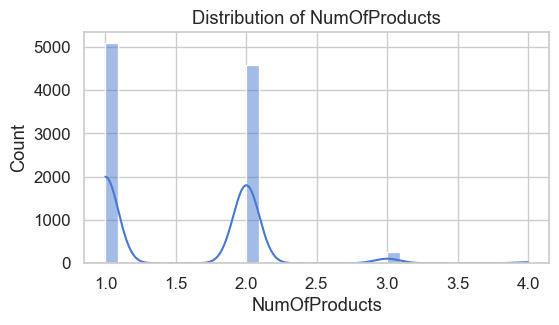

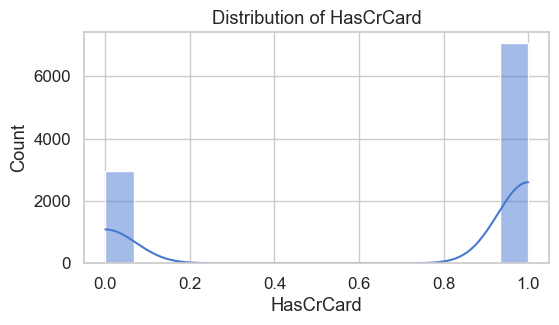

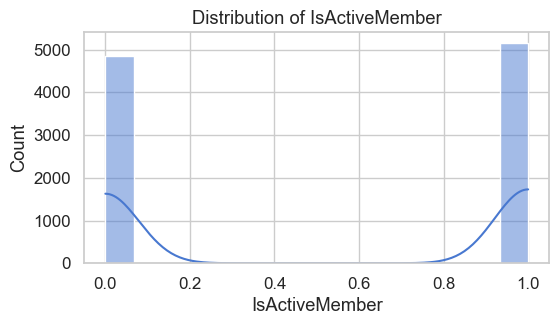

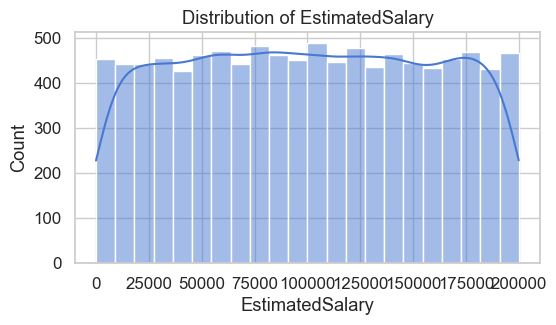

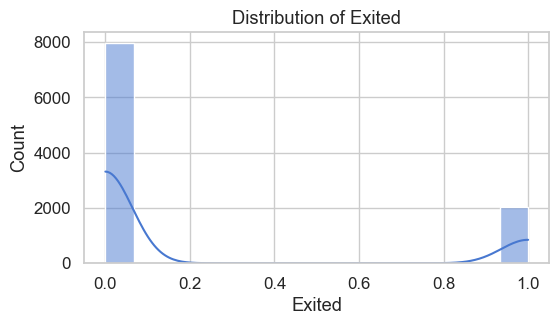

In [11]:
num_cols = df_clean.select_dtypes(include=['int64', 'float64']).columns.tolist()

for col in num_cols:
    plt.figure(figsize=(6, 3))
    sns.histplot(df_clean[col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

### Categorical Distribution

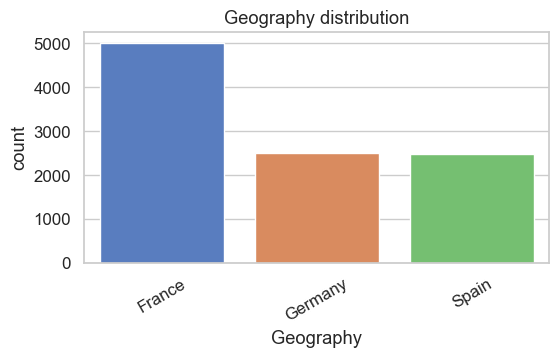

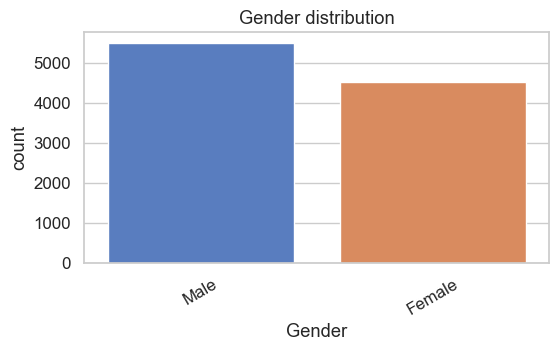

In [12]:
cat_cols = df_clean.select_dtypes(include=['object', 'category']).columns.tolist()

for col in cat_cols:
    plt.figure(figsize=(6,3))
    sns.countplot(data=df_clean, x=col, order=df_clean[col].value_counts().index)
    plt.title(f'{col} distribution')
    plt.xticks(rotation=30)

### Categorical Distribution (Plotly)

In [13]:
import plotly.express as px

# Get all categorical columns
cat_cols = df_clean.select_dtypes(include=['object', 'category']).columns.tolist()

for col in cat_cols:
    # Count values for the categorical column
    counts = df_clean[col].value_counts().reset_index()
    counts.columns = [col, "Count"]

    # Create bar chart
    fig = px.bar(
        counts,
        x=col,
        y="Count",
        text="Count",  # show counts on bars
        title=f"{col} distribution",
        color=col      # color bars by category
    )
    
    # Rotate x-axis labels for readability
    fig.update_layout(xaxis=dict(tickangle=30))
    
    # Show interactive chart
    fig.show()


### Target Distribution(Exited)

In [14]:
import plotly.express as px

# Value counts (both raw count and proportion)
churn_counts = df_clean['Exited'].value_counts().reset_index()
churn_counts.columns = ['Exited', 'Count']
churn_counts['Proportion'] = churn_counts['Count'] / churn_counts['Count'].sum()

# Plot with Plotly
fig = px.bar(
    churn_counts,
    x='Exited',
    y='Count',
    text=churn_counts['Proportion'].apply(lambda p: f"{p:.2%}"),  # show % on bars
    color='Exited',
    title="Target Variable: Exited (Churn)"
)

fig.update_layout(xaxis=dict(tickmode='array', tickvals=[0,1], ticktext=['Stayed (0)', 'Churned (1)']))
fig.show()


### Bivariate: Categorical vs Exited

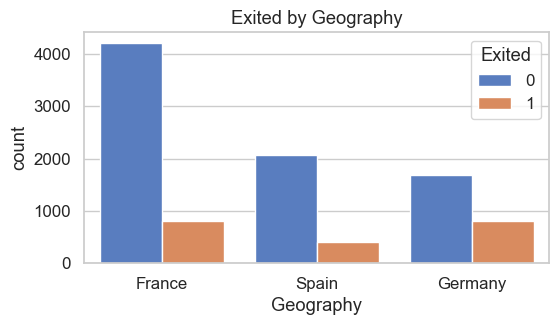

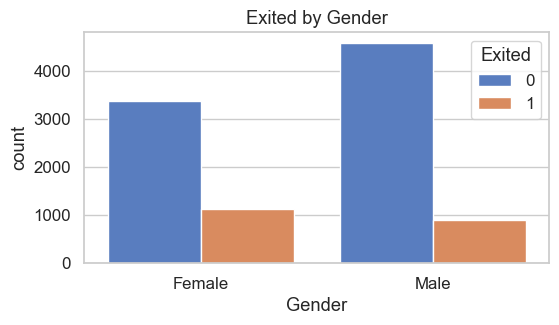

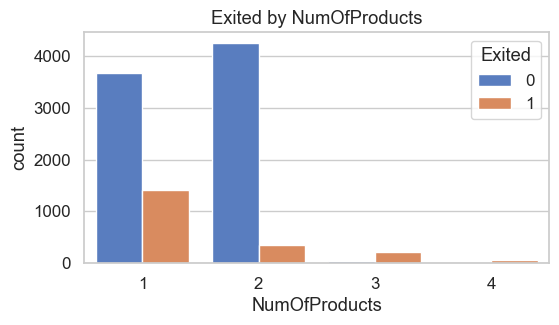

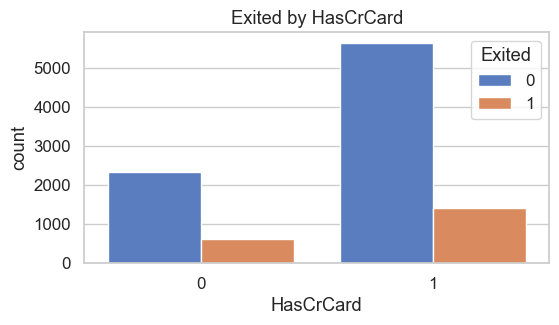

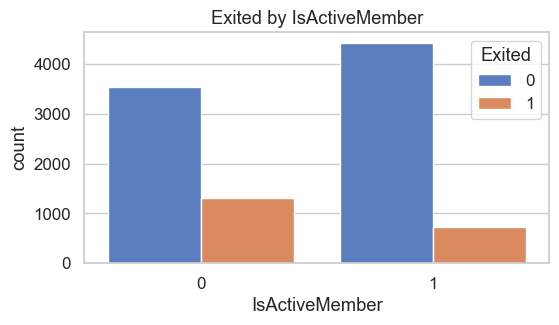

In [15]:
for col in ["Geography", "Gender", "NumOfProducts", "HasCrCard", "IsActiveMember"]:
    plt.figure(figsize=(6,3))
    sns.countplot(data=df_clean, x=col, hue='Exited')
    plt.title(f'Exited by {col}')
    plt.show()

### Bivariate: Categorical vs Exited (Plotly)

In [16]:
import plotly.express as px

for col in ["Geography", "Gender", "NumOfProducts", "HasCrCard", "IsActiveMember"]:
    fig = px.histogram(
        df_clean,
        x=col,
        color="Exited",            # this is like hue in seaborn
        barmode="group",           # side-by-side bars (use "stack" if you prefer stacked bars)
        text_auto=True,            # show counts on bars
        title=f"Exited by {col}"
    )
    fig.update_layout(
        xaxis_title=col,
        yaxis_title="Count",
        bargap=0.2
    )
    fig.show()


### Bivariate: Numeric vs Exited

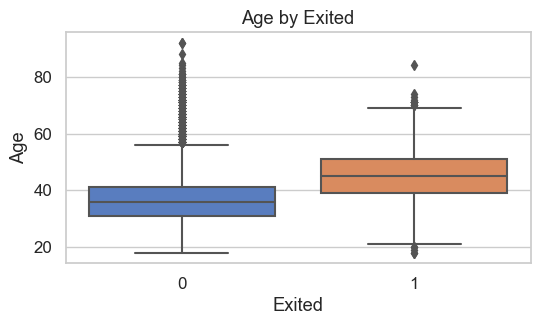

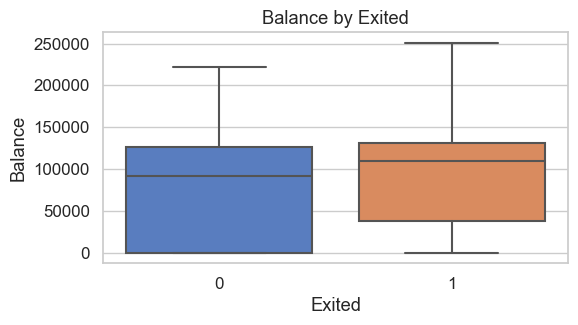

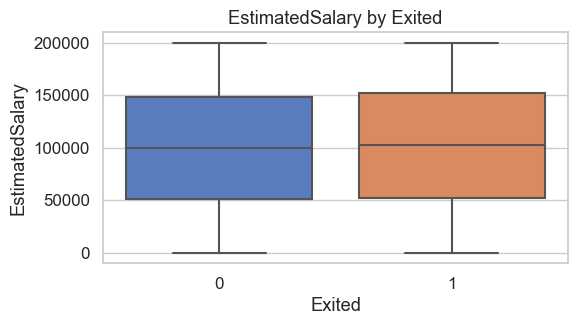

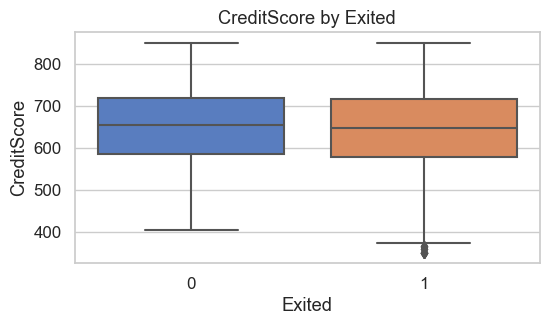

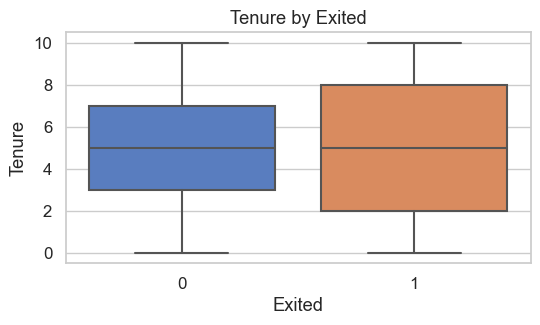

In [17]:
for col in ['Age', 'Balance', 'EstimatedSalary', 'CreditScore', 'Tenure']:
    plt.figure(figsize=(6, 3))
    sns.boxplot(data=df_clean, x='Exited', y=col)
    plt.title(f'{col} by Exited')
    plt.show()

### Bivariate: Numeric vs Exited (Interactive Chart With Plotly)

In [18]:
import plotly.express as px
import plotly.io as pio

# Show plots in your default web browser
# pio.renderers.default = "browser"

# OPTION 2: Show inline inside Jupyter as an iframe (interactive but inside the notebook)
pio.renderers.default = "notebook"

for col in ['Age', 'Balance', 'EstimatedSalary', 'CreditScore', 'Tenure']:
    fig = px.box(
        df_clean, 
        x="Exited", 
        y=col, 
        points="outliers",   # show only outliers instead of all points
        color="Exited", 
        title=f"{col} by Exited"
    )
    fig.show()


### Multivariate Analysis

In [25]:
# Churn by age + gender

fig = px.histogram(
    df_clean,
    x='Age',
    color='Gender',
    facet_col='Exited',
    barmode='overlay',
    nbins=20,
    title='Age & Gender Distribution by Churn'
)

fig.show()

In [26]:
# Churn by geography + product

fig = px.histogram(
    df_clean,
    x='Geography',
    color='NumOfProducts',
    facet_col='Exited',
    barmode='group',
    title='Geography vs. Products by Churn'
)

fig.show()

In [28]:
# Churn heatmap across multiple categorical variables

cross_tab = pd.crosstab(
    [df_clean['Geography'], df_clean['Gender']],
    df_clean['Exited'],
    normalize='index'
)

fig = px.imshow(
    cross_tab,
    text_auto=True,
    color_continuous_scale='Reds',
    title='Churn Rates by Geography & Gender'
)

fig.show()

C:\Users\Alexander Olomokoro\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



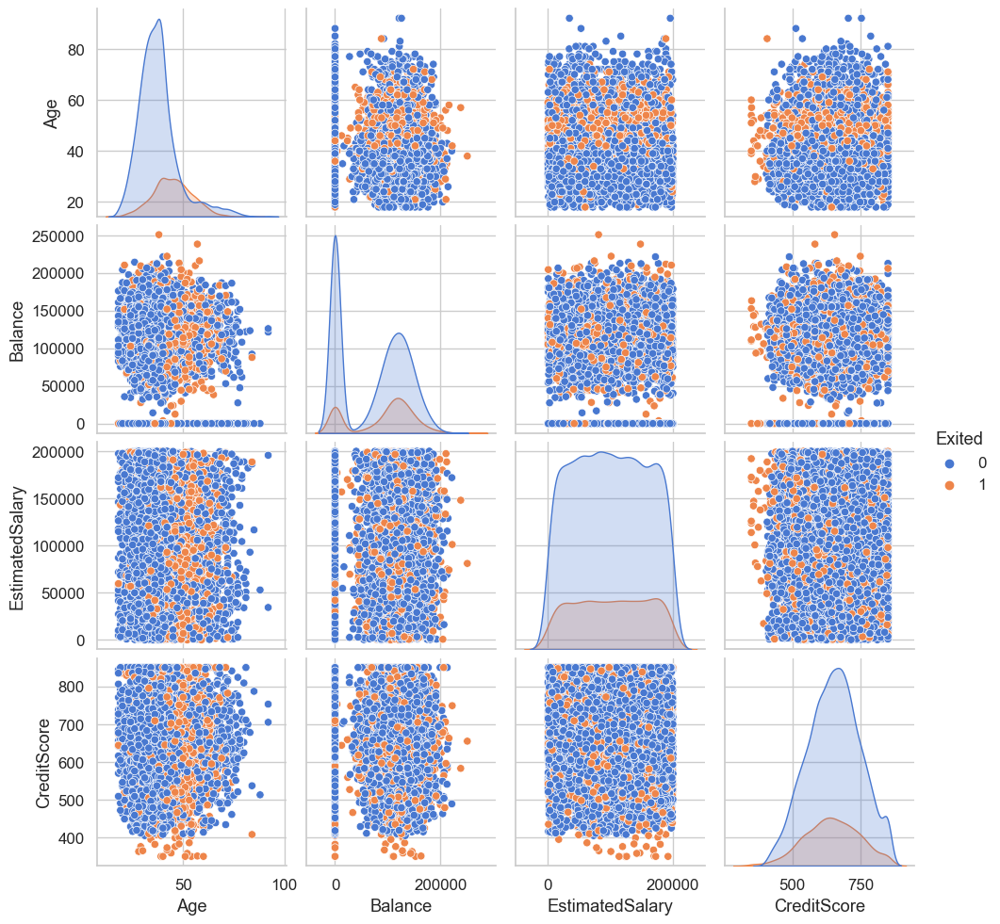

In [29]:
# Pairplot (Numerical Relationships)

sns.pairplot(df_clean[['Age', 'Balance', 'EstimatedSalary', 'CreditScore', 'Exited']], hue='Exited')

### Corelation Heatmap

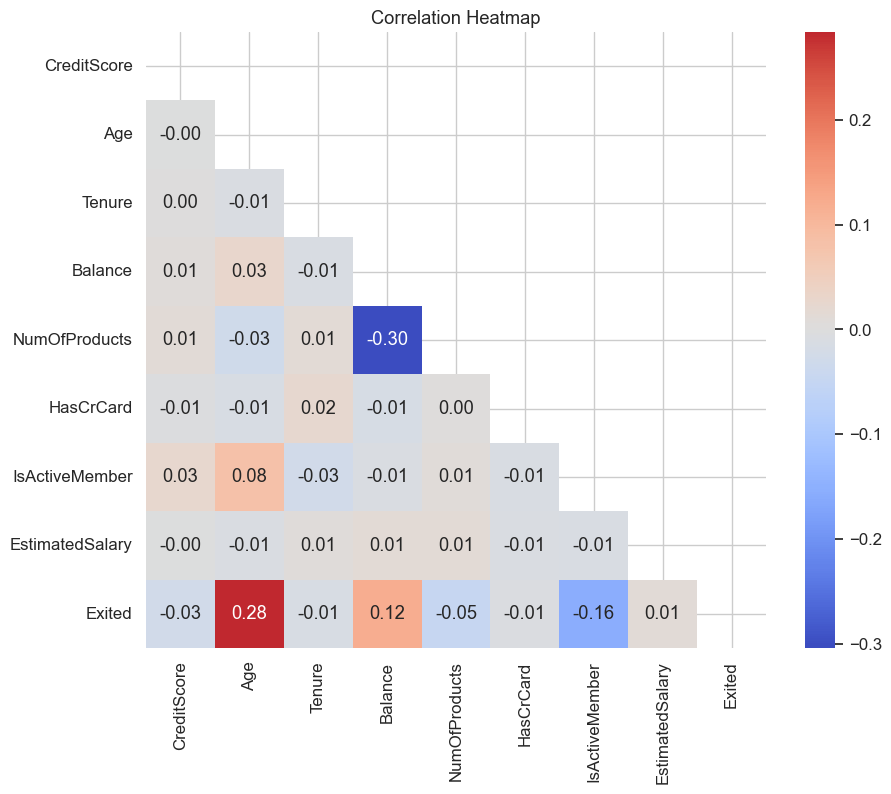

In [19]:
corr = df_clean.select_dtypes(include=["int64","float64"]).corr()
plt.figure(figsize=(10,8))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Correlation Heatmap")
plt.show()


### Correlation Heatmap (Plotly)

In [20]:
# Calculate correlation matrix
corr = df_clean.select_dtypes(include=["int64", "float64"]).corr()

# Create interactive heatmap
fig = px.imshow(
    corr, 
    text_auto=".2f",   # show correlation values with 2 decimal places
    color_continuous_scale="RdBu_r",  # red-blue diverging colormap
    zmin=-1, zmax=1,   # correlation ranges from -1 to 1
    title="Correlation Heatmap (Interactive)"
)

# Show the heatmap
fig.show()


### Top Strongest Corelations

In [21]:
# Flatten correlation matrix and sort
corr_pairs = (
    corr.where(~np.eye(corr.shape[0], dtype=bool))  # remove self-correlations (1.0)
    .stack()                                        # turn into Series (row, col)
    .reset_index()
)
corr_pairs.columns = ["Feature 1", "Feature 2", "Correlation"]

# Sort by strongest correlations
top_corr = corr_pairs.reindex(corr_pairs["Correlation"].abs().sort_values(ascending=False).index)

# Show top 10 correlations
print(top_corr.head(10))


         Feature 1       Feature 2  Correlation
27         Balance   NumOfProducts    -0.304180
35   NumOfProducts         Balance    -0.304180
65          Exited             Age     0.283711
15             Age          Exited     0.283711
70          Exited  IsActiveMember    -0.156128
55  IsActiveMember          Exited    -0.156128
67          Exited         Balance     0.118533
31         Balance          Exited     0.118533
13             Age  IsActiveMember     0.081094
49  IsActiveMember             Age     0.081094


### Outlier Check

In [22]:
def iqr_outliers(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    return ((series < (q1 - 1.5*iqr)) | (series > (q3 + 1.5*iqr))).sum()

for col in ["Balance","EstimatedSalary","CreditScore"]:
    print(col, "Outliers:", iqr_outliers(df_clean[col].dropna()))


Balance Outliers: 0
EstimatedSalary Outliers: 0
CreditScore Outliers: 15


In [23]:
df_clean.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42.0,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41.0,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42.0,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39.0,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43.0,2,125510.82,1,1,1,79084.10,0


### General

out of 10,000 customers, 20.37% churned

### Observations from Cat vs Exited (Churn)

Most churners are from france and germany (almost equal, germany 814 churned, france 810)

Females churn more males (although figures are almost equal, female 1132, male 905)

Customers that have just 1 product churn the most, the churn amount drastically drops when a customer has 2 or more products (1049 customers with 1 product churned, 348 with 2 churned, 220 with 3 and 60 with 4)

Customers with 'HasCrCard' as 1 (1424 customers) churn the most

None active members churn more than active members

### Observations from Numeric vs Exited (Churn)

Min churn age is 18 and Max churn age is 84. 50% of churners are between 39-51. 25% of churners are above 51. Median age of churners is 45

Min balance of churners is 0 and max is 250,898.1 Median is 109,349.3 50% of churners have balances betwen 37896.75 and 131,435.4

50% of churners have an estimated salary between 51,898.78 and 152,429.9 Median estimated salary is 102,460.8 Min estimated salary of churners is 11.58 max estimated salary for churners is 199,808.1

50% of churners have credit scores between 578 and 716. Median score of 646. 25% have scores below 578 and 25% have scores above 716

Most churners have tenures between 2 and 8. Median tenure of 5

### Observations from Correlation Heatmap

Theres a negative correlation (-0.3) between numOfProducts and Balance
Theres a positive correlation (0.28) between exited and age

# Executive Summary By Olomukoro: Customer Churn Analysis  

I analyzed a dataset of **10,000 customers** to identify patterns contributing to customer churn.  
The overall churn rate stands at **20.37%**, representing a significant segment of the customer base.  

---

## Key Insights  

### 1. Demographic & Geographic Trends  
- Churn is **higher among females** compared to males (**1,132 vs. 905**).  
- Customers in **France and Germany** show the highest churn, contributing nearly equally (**814 and 810 churners**, respectively).  

### 2. Product & Membership Behavior  
- Customers with **only 1 product** are far more likely to churn (**1,049**) compared to those with multiple products  
  - 2 products → **348 churners**  
  - 3 products → **220 churners**  
  - 4 products → **60 churners**  
- **Inactive members** churn more often than active members.  
- Customers with credit cards (`HasCrCard = 1`) represent a **higher share of churners (1,424)**.  

### 3. Financial & Credit Characteristics  
- Churners typically fall in the **mid-age range (39–51 years)**, with a **median age of 45**.  
- **Median balance** among churners is **$109,349**, with churn spanning all balance ranges.  
- **50% of churners** have credit scores between **578–716**, indicating mid-level risk profiles.  
- Churn is most common among customers with **2–8 years of tenure** (median = 5 years).  

### 4. Correlation Analysis  
- **Age has a positive correlation with churn (+0.28)** → older customers are more likely to exit.  
- **Number of products is negatively correlated with balance (-0.3)** → product engagement impacts retention.  

---

## Recommendations to Reduce Churn  

1. **Strengthen Multi-Product Engagement**  
   - Incentivize single-product customers to adopt additional products through targeted cross-selling and bundled offers.  

2. **Target At-Risk Segments with Retention Programs**  
   - Focus on mid-aged customers (**39–51**) and customers in **France & Germany**.  
   - Loyalty programs, personalized offers, and proactive outreach can help stabilize these groups.  

3. **Boost Customer Activity & Engagement**  
   - Encourage inactive members to re-engage (e.g., personalized notifications, rewards for activity, digital engagement programs).  
   - Since inactivity strongly correlates with churn, reactivation campaigns can be highly impactful.  

---

👉 This analysis highlights that churn is concentrated among **single-product, mid-aged, and less-engaged customers**.  
Addressing these areas with **tailored engagement strategies, loyalty programs, and product adoption campaigns** can significantly reduce churn rates and improve customer lifetime value.  
